## Обзор данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import json

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод**
- Есть столбцы с пропущенными значениями;
- Необходимо изменить тип данных в некоторых столбцах (seats, chain);
- Важно проверить на наличие дубликатов;
- Всего представлено 8406 заведений;

## Предобработка данных

In [5]:
data.duplicated().sum() #проверяем на количество явных дубликатов

0

In [6]:
data['name'] = data['name'].str.lower()
data['category'] = data['category'].str.lower()
data['address'] = data['address'].str.lower()

In [7]:
data[data[['name', 'category','address']].duplicated(keep=False)] #проверим на наличие неявных дубликатов

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Видим наличие неявных дубликатов.   
- У "кафе" координаты различаются, как и время работы. Если проверить по карте, то данные заведения действительно находятся поблизости от ангарского пруда - адресс указан корректно. Оставляем два заведения.  
- У "more poke" координаты совпадают, при этом в одной строке наблюдается более детальное как расписание работы, так и информация о характере заведения (сетевое или не сетевое). Имеет смысл удалить менее информативную строку.


In [8]:
data = data.drop(1430, axis=0).reset_index(drop=True)

In [9]:
data[data[['name', 'category','address']].duplicated(keep=False)] 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN


In [10]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5090
avg_bill             4589
middle_avg_bill      5256
middle_coffee_cup    7870
chain                   0
seats                3611
dtype: int64

In [11]:
pd.DataFrame(round(data.isna().mean().sort_values(ascending=False)*100,1)).style.background_gradient('coolwarm')

,0
middle_coffee_cup,93.600000
middle_avg_bill,62.500000
price,60.600000
avg_bill,54.600000
seats,43.000000
hours,6.400000
name,0.000000
category,0.000000
address,0.000000
district,0.000000


Вывод:
- Наибольшая доля пропусков имеется у стобца 'middle_coffee_cup' - следует заменить значения пропущенные значения на 0;
- В столбцах 'middle_avg_bill', 'price', 'avg_bill' пропущенные значения поменяем на 0;
- В столбцах 'seats', 'hours' пропущенные значения заменим на 0.    

In [12]:
data['price'] = data['price'].fillna(0)
data['avg_bill'] = data['avg_bill'].fillna(0)

In [13]:
data['seats'] = data['seats'].fillna(0)
data['hours'] = data['hours'].fillna(0)

In [14]:
data['seats'] = data['seats'].astype('int')

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8405 entries, 0 to 8404
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8405 non-null   object 
 1   category           8405 non-null   object 
 2   address            8405 non-null   object 
 3   district           8405 non-null   object 
 4   hours              8405 non-null   object 
 5   lat                8405 non-null   float64
 6   lng                8405 non-null   float64
 7   rating             8405 non-null   float64
 8   price              8405 non-null   object 
 9   avg_bill           8405 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8405 non-null   int64  
 13  seats              8405 non-null   int64  
dtypes: float64(5), int64(2), object(7)
memory usage: 919.4+ KB


In [16]:
# Заменяем 0 на "Не сетевое" и 1 на "Сетевое" в столбце 'chain'
data['chain'] = data['chain'].replace({0: 'Не сетевое', 1: 'Сетевое'})

In [17]:
data['street'] = data['address'].str.split(', ').str[1].str.strip()

In [19]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

**Вывод**
- дубликаты были найдены и удалены;
- некоторые пропущенные значения поменяли на 0;
- поменяли тип данных;
- создали столбцы с названием улицы и с информацией о круглосуточной работе;

## Исследовательский анализ данных

In [21]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [22]:
category_counts = data['category'].value_counts()

print(category_counts)

кафе               2378
ресторан           2042
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64


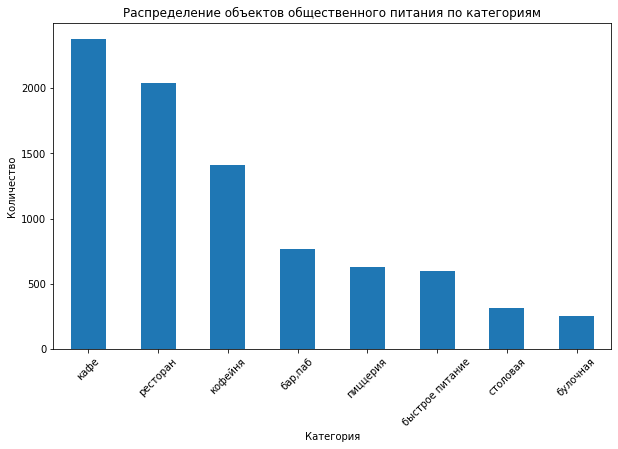

In [23]:
plt.figure(figsize=(10, 6))
category_counts.plot(kind='bar', rot=45)
plt.xlabel('Категория')
plt.ylabel('Количество') 
plt.title('Распределение объектов общественного питания по категориям')
plt.show()

Вывод
- в топ 3 по количеству заведений: кафе, ресторан и кофейня;
- наименьшее количество заведений в Москве у категорий столовая и булочная;

In [24]:
filtered_data = data[data['seats'] != 0]
seats_by_category = filtered_data.groupby('category')['seats'].median().sort_values(ascending=False)
print(seats_by_category)


category
ресторан           90
бар,паб            84
кофейня            80
столовая           80
быстрое питание    75
кафе               60
пиццерия           56
булочная           52
Name: seats, dtype: int64


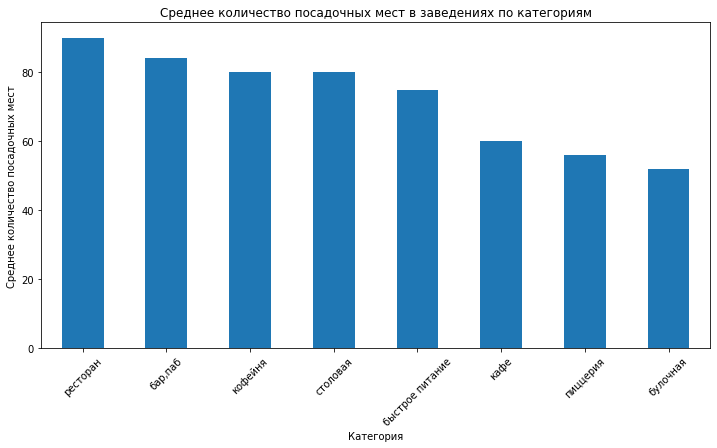

In [25]:
# Строим столбчатую диаграмму для визуализации
plt.figure(figsize=(12, 6))
seats_by_category.plot(kind='bar', rot=45)
plt.xlabel('Категория')
plt.ylabel('Среднее количество посадочных мест')
plt.title('Среднее количество посадочных мест в заведениях по категориям')
plt.show()

Вывод
- Наибольшее количество посадочных мест наблюдается у бара/паба, ресторана и кофейни;
- Наименьшее у кафе, пиццерии и булочной.
- Разница в количестве посадочных мест не настолько существенная относительно распределения кол-ва заведений по категориям;

In [26]:
chain_counts = data['chain'].value_counts()

print(chain_counts)

Не сетевое    5200
Сетевое       3205
Name: chain, dtype: int64


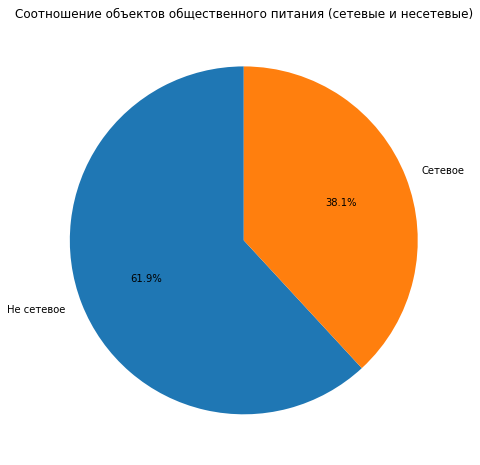

In [27]:
plt.figure(figsize=(8, 8))
chain_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.title('Соотношение объектов общественного питания (сетевые и несетевые)')
plt.ylabel('')
plt.show()

- не сетевых заведений значительно больше сетевых;

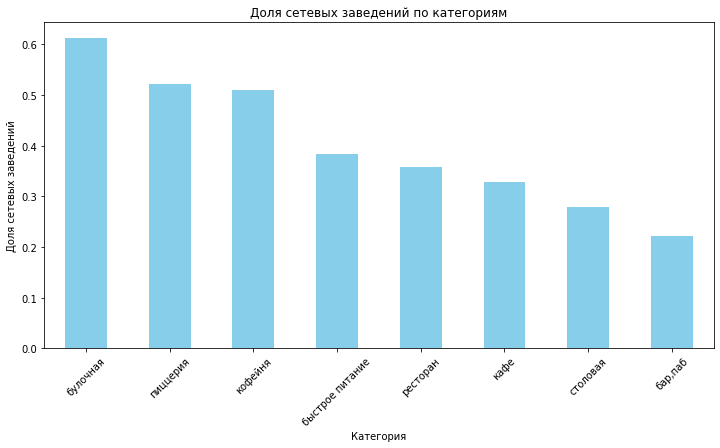

In [28]:
category_total = data['category'].value_counts()
category_chain = data[data['chain'] == 'Сетевое']['category'].value_counts()

category_chain_ratio = (category_chain / category_total).sort_values(ascending=False)

plt.figure(figsize=(12, 6))
category_chain_ratio.plot(kind='bar', color='skyblue')
plt.xlabel('Категория')
plt.ylabel('Доля сетевых заведений')
plt.title('Доля сетевых заведений по категориям')
plt.xticks(rotation=45)
plt.show()


- по графику видно, что сетевыми чаще являются категории: булочная, пиццерия и кофейни.

In [29]:
# Группируем данные по названиям заведений и подсчитываем количество заведений каждой сети
chain_data = data[data['chain'] == 'Сетевое']
chain_counts = data['name'].value_counts()

In [30]:
top_15_chains = chain_counts.head(15)
top_15_chains

кафе                                   189
шоколадница                            120
домино'с пицца                          77
додо пицца                              74
one price coffee                        72
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
шаурма                                  43
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
ресторан                                34
Name: name, dtype: int64

In [31]:
pivot_table = data[data['name'].isin(top_15_chains.index)].pivot_table(index='name', values='category', aggfunc='first').sort_values(by='category', ascending=False)
pivot_table

,category
name,
prime,ресторан
ресторан,ресторан
теремок,ресторан
яндекс лавка,ресторан
додо пицца,пиццерия
домино'с пицца,пиццерия
cofix,кофейня
one price coffee,кофейня
кофепорт,кофейня


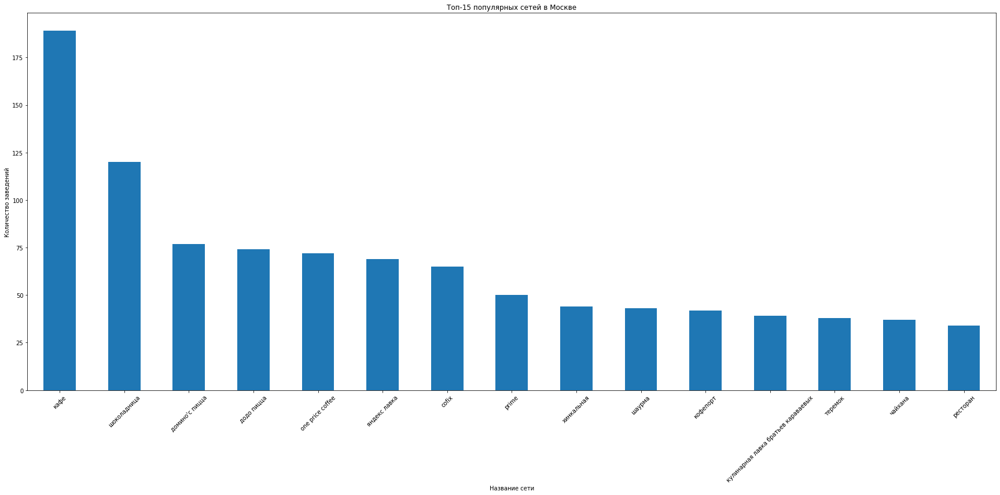

In [32]:
plt.figure(figsize=(30,12)) 
top_15_chains.plot(kind='bar', rot=45)  
plt.xlabel('Название сети')  
plt.ylabel('Количество заведений')  
plt.title('Топ-15 популярных сетей в Москве')  
plt.show()

- среди топ-15 сетей по популярности первое место со значительным отрывом занимает сеть "Кафе", далее идут знакомые сети "Шоколадница", "Доминос пицца", "Додо Пицца", кофейни "One Price Coffe", "Cofix" и другие.
- если смотреть по категориям, то "Кафе" (категория кафе), далее идут категория пиццерия и кофейня.
- рестораны и заведения быстрого питания менее популярные.

In [33]:
# Создаем сводную таблицу, где индексами будут административные районы, столбцами - категории, значениями - количество заведений
pivot_table = data.pivot_table(index='district', columns='category', values='name', aggfunc='count', fill_value=0)
# Добавляем столбец с общим количеством заведений в каждом районе
pivot_table['Общее количество'] = pivot_table.sum(axis=1)
sorted_pivot_table = pivot_table.sort_values(by='Общее количество', ascending=False)

<Figure size 1152x576 with 0 Axes>

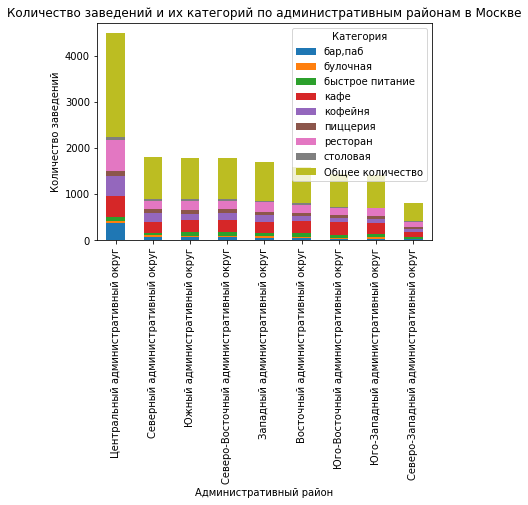

In [34]:
plt.figure(figsize=(16, 8)) 
sorted_pivot_table.plot(kind='bar', stacked=True)
plt.xlabel('Административный район')  
plt.ylabel('Количество заведений')  
plt.title('Количество заведений и их категорий по административным районам в Москве')
plt.legend(title='Категория')
plt.show()

- Среди девяти административных районов ЦАО имеет наибольшее кол-во заведений, СЗАО - наименьшее;
- При этом в большинстве адиминстративных районов именно категория кафе наиболее популярная, далее по популярности идут кофейни и рестораны;
- Важно отметить, что в ЦАО наблюдается наибольшее кол-во баров и пабов.

In [35]:
mean_ratings_by_category = data.groupby('category')['rating'].mean()

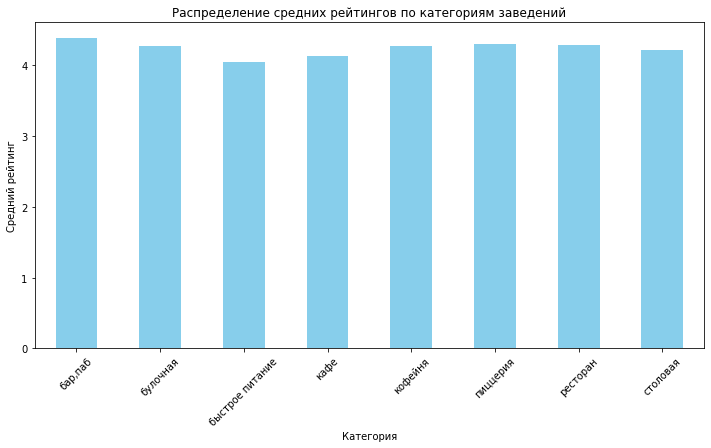

In [36]:
plt.figure(figsize=(12, 6))
mean_ratings_by_category.plot(kind='bar', color='skyblue')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xticks(rotation=45) 
plt.show()

- по графику видно, что сильных различий в рейтинге заведений по категориям не наблюдается;
- наибольший средний рейтинг у баров и пабов, наименьший у быстрого питания.

In [37]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [38]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

- по хороплету видно, что ЦАО имеет наибольший средний рейтинг заведений

In [39]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

0       None
1       None
2       None
3       None
4       None
        ... 
8400    None
8401    None
8402    None
8403    None
8404    None
Length: 8405, dtype: object

In [40]:
# выводим карту
m

- наибольшая концентрация заведений наблюдается ближе к центру Москвы;

<Figure size 864x576 with 0 Axes>

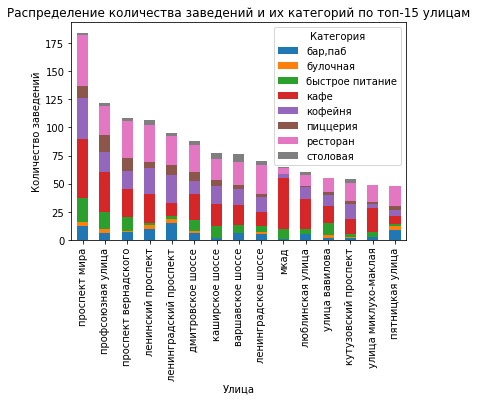

In [41]:
top_15_streets = data['street'].value_counts().head(15).index

# Фильтруем данные, оставляя только заведения на топ-15 улицах
top_15_data = data[data['street'].isin(top_15_streets)]

# Группируем данные по улицам и категориям, подсчитывая количество заведений
street_category_counts = top_15_data.groupby(['street', 'category']).size().unstack(fill_value=0)

# Строим столбчатую диаграмму для визуализации
plt.figure(figsize=(12, 8))  # Задаем размер графика

# Сортируем улицы по общему количеству заведений на них
sorted_streets = top_15_data['street'].value_counts().index

# Строим столбцы для каждой улицы (с учетом сортировки)
street_category_counts = street_category_counts.loc[sorted_streets]
street_category_counts.plot(kind='bar', stacked=True)
plt.xlabel('Улица')  # Подпись оси X
plt.ylabel('Количество заведений')  # Подпись оси Y
plt.title('Распределение количества заведений и их категорий по топ-15 улицам')
plt.xticks(rotation=90)  # Поворачиваем подписи оси X для лучшей читаемости

plt.legend(title='Категория')
plt.show()


- на Проспекте Мира наблюдается наибольшее кол-во заведений, среди которых категории кафе, кофейня и ресторан имеют наибольший удельный вес;
- далее идут Профсоюзная улица и проспект Вернадского с Ленинским проспектом (по категориям динамика та же).

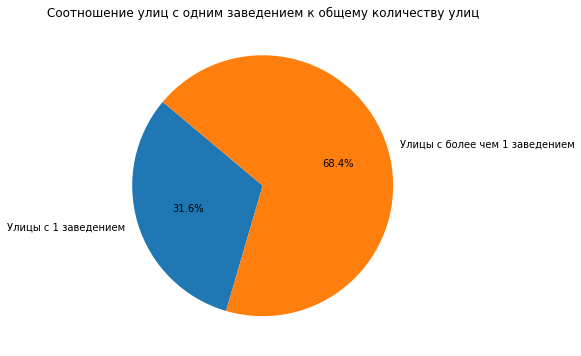

In [42]:
# Подсчитываем количество улиц с одним заведением
street_counts = data['street'].value_counts()
streets_with_one_place = street_counts[street_counts == 1].index
count_of_streets_with_one_place = len(streets_with_one_place)

# Общее количество улиц
total_street_count = len(data['street'].unique())

# Создаем список для отображения данных на графике
street_counts_data = [count_of_streets_with_one_place, total_street_count - count_of_streets_with_one_place]
labels = ['Улицы с 1 заведением', 'Улицы с более чем 1 заведением']

# Строим график
plt.figure(figsize=(8, 6))
plt.pie(street_counts_data, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('Соотношение улиц с одним заведением к общему количеству улиц')
plt.show()

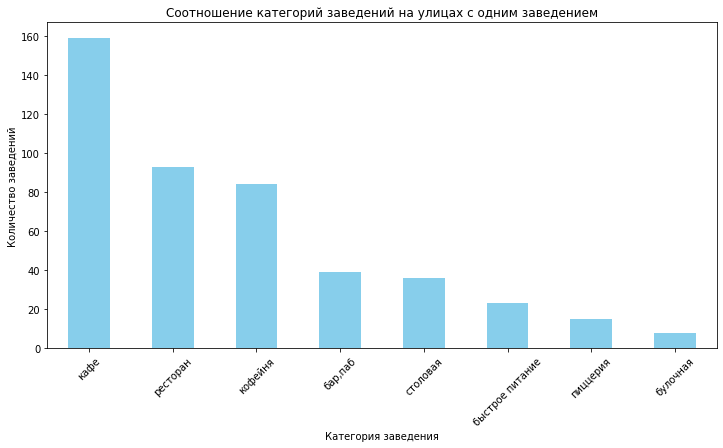

In [43]:
street_counts = data['street'].value_counts()
streets_with_one_place = street_counts[street_counts == 1].index

# Фильтруем данные для улиц с одним заведением
data_one_place_streets = data[data['street'].isin(streets_with_one_place)]

# Подсчитываем количество заведений каждой категории на таких улицах
category_counts = data_one_place_streets['category'].value_counts()

# Создаем график
plt.figure(figsize=(12, 6))
category_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.title('Соотношение категорий заведений на улицах с одним заведением')
plt.xticks(rotation=45)
plt.show()

In [44]:
count_of_streets_with_one_place

457

- почти треть от общего количества занимают улицы с одним заведением (458 заведений);
- Первое место среди таких улиц занимают заведения в категории кафе;
- Возможно на этих улицах находятся сетевые или заведения с большой рентабельностью, у которых минимальная конкуренция

In [45]:
data['middle_avg_bill'].head()

0       NaN
1    1550.0
2    1000.0
3       NaN
4     500.0
Name: middle_avg_bill, dtype: float64

In [46]:
median_coffee_prices_by_district = data.groupby('district')['middle_coffee_cup'].median().reset_index()
display(median_coffee_prices_by_district.sort_values('middle_coffee_cup', ascending = False))

,district,middle_coffee_cup
7,Юго-Западный административный округ,197.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
4,Северо-Западный административный округ,150.0
8,Южный административный округ,149.5
6,Юго-Восточный административный округ,145.0
0,Восточный административный округ,135.0


In [47]:
#Код ревьюера
median_avg_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
display(median_avg_bill.sort_values('middle_avg_bill', ascending = False))

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [48]:
Choropleth(
    geo_data=state_geo,
    data=median_coffee_prices_by_district,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный значения средних чеков заведений',
).add_to(m)

# выводим карту
m

- график показывает, что в ЦАО, а также в ЗАО И ЮЗАО наибольшше значение среднего чека заведений;
- при этом удаленность от центра не обязательно должна гарантировать снижение этого показателя: так, в ЗАО средний чек гораздо ниже чем в ВАО.
- Возможно имеет значение стоимость недвижимости, т.к. именно в ЦАО и ЗАО недвижимость наиболее дорогая.

**Вывод**
- в топ 3 по количеству заведений: кафе, ресторан и кофейня;
- наименьшее количество заведений в Москве у категорий столовая и булочная;
- Наибольшее количество посадочных мест наблюдается у бара/паба, ресторана и кофейни;
- Наименьшее у кафе, пиццерии и булочной.
- Разница в количестве посадочных мест не настолько существенная относительно распределения кол-ва заведений по категориям;
- не сетевых заведений значительно больше сетевых;
- по графику видно, что сетевыми чаще являются категории: булочная, пиццерия и кофейни.
- среди топ-15 сетей по популярности первое место со значительным отрывом занимает сеть "Кафе", далее идут знакомые сети "Шоколадница", "Доминос пицца", "Додо Пицца", кофейни "One Price Coffe", "Cofix" и другие.
- если смотреть по категориям, то "Кафе" (категория кафе), далее идут категория пиццерия и кофейня.
- рестораны и заведения быстрого питания менее популярные.
- Среди девяти административных районов ЦАО имеет наибольшее кол-во заведений, СЗАО - наименьшее;
- При этом в большинстве адиминстративных районов именно категория кафе наиболее популярная, далее по популярности идут кофейни и рестораны;
- Важно отметить, что в ЦАО наблюдается наибольшее кол-во баров и пабов.
- по графику видно, что сильных различий в рейтинге заведений по категориям не наблюдается;
- наибольший средний рейтинг у баров и пабов, наименьший у быстрого питания.
- по хороплету видно, что ЦАО имеет наибольший средний рейтинг заведений.
- наибольшая концентрация заведений наблюдается ближе к центру Москвы;
- на Проспекте Мира наблюдается наибольшее кол-во заведений, среди которых категории кафе, кофейня и ресторан имеют наибольший удельный вес;
- далее идут Профсоюзная улица и проспект Вернадского и Ленинский проспект (по категориям динамика та же).
- почти треть от общего количества занимают улицы с одним заведением (458 заведений);
- Первое место среди таких улиц занимают заведения в категории кафе;
- Возможно на этих улицах находятся сетевые или заведения с большой рентабельностью, у которых минимальная конкуренция.
- график показывает, что в ЦАО, а также в ЗАО И ЮЗАО наибольшше значение среднего чека заведений;
- при этом удаленность от центра не обязательно должна гарантировать снижение этого показателя: так, в ЗАО средний чек гораздо ниже чем в ВАО.
- Возможно имеет значение стоимость недвижимости, т.к. именно в ЦАО и ЗАО недвижимость наиболее дорогая.

## Детализация исследования

In [49]:
total_coffee_shops = data[data['category'] == 'кофейня']['name'].count()

print(f"Общее количество кофеен в датасете: {total_coffee_shops}")

# Группируем данные по районам и подсчитываем количество кофеен в каждом районе
coffee_shops_by_district = data[data['category'] == 'кофейня']['district'].value_counts()

# Выводим район с наибольшим количеством кофеен и количество кофеен в этом районе
most_coffee_shops_district = coffee_shops_by_district.idxmax()
most_coffee_shops_count = coffee_shops_by_district.max()

print(f"Район с наибольшим количеством кофеен: {most_coffee_shops_district}")
print(f"Количество кофеен в этом районе: {most_coffee_shops_count}")

Общее количество кофеен в датасете: 1413
Район с наибольшим количеством кофеен: Центральный административный округ
Количество кофеен в этом районе: 428


In [50]:
min_coffee_shops_district = coffee_shops_by_district.idxmin()
min_coffee_shops_count = coffee_shops_by_district.min()

print(f"Район с наименьшим количеством кофеен: {min_coffee_shops_district}")
print(f"Количество кофеен в этом районе: {min_coffee_shops_count}")

Район с наименьшим количеством кофеен: Северо-Западный административный округ
Количество кофеен в этом районе: 62


In [51]:
coffee_shops = data[data['category'] == 'кофейня']

# Проверяем, есть ли круглосуточные кофейни
round_the_clock_coffee_shops = coffee_shops[coffee_shops['hours'].str.contains('круглосуточно', case=False, na=False)]

if not round_the_clock_coffee_shops.empty:
    print("Да, есть круглосуточные кофейни в датасете.")
else:
    print("Нет, круглосуточных кофеен в датасете не найдено.")

Да, есть круглосуточные кофейни в датасете.


In [52]:
print(("Всего круглосуточных кофеен в регионе:"), len(round_the_clock_coffee_shops))

Всего круглосуточных кофеен в регионе: 76


In [53]:
coffee_shops = data[data['category'] == 'кофейня'][['district', 'rating']]

# Выводим информацию о рейтингах кофеен
print("Рейтинги кофеен:")
print(coffee_shops)

# Группируем данные по районам и вычисляем средний рейтинг кофеен в каждом районе
average_rating_by_district = coffee_shops.groupby('district')['rating'].mean().sort_values()

# Выводим средний рейтинг кофеен по районам
print("Средний рейтинг кофеен по районам:")
print(average_rating_by_district)

Рейтинги кофеен:
                                  district  rating
3          Северный административный округ     5.0
25         Северный административный округ     4.3
45         Северный административный округ     4.0
46         Северный административный округ     3.6
52         Северный административный округ     3.8
...                                    ...     ...
8355  Юго-Восточный административный округ     4.5
8364  Юго-Восточный административный округ     4.2
8375  Юго-Восточный административный округ     4.1
8384  Юго-Восточный административный округ     4.7
8399   Юго-Западный административный округ     4.4

[1413 rows x 2 columns]
Средний рейтинг кофеен по районам:
district
Западный административный округ            4.195333
Северо-Восточный административный округ    4.216981
Юго-Восточный административный округ       4.225843
Южный административный округ               4.232824
Восточный административный округ           4.282857
Юго-Западный административный округ       

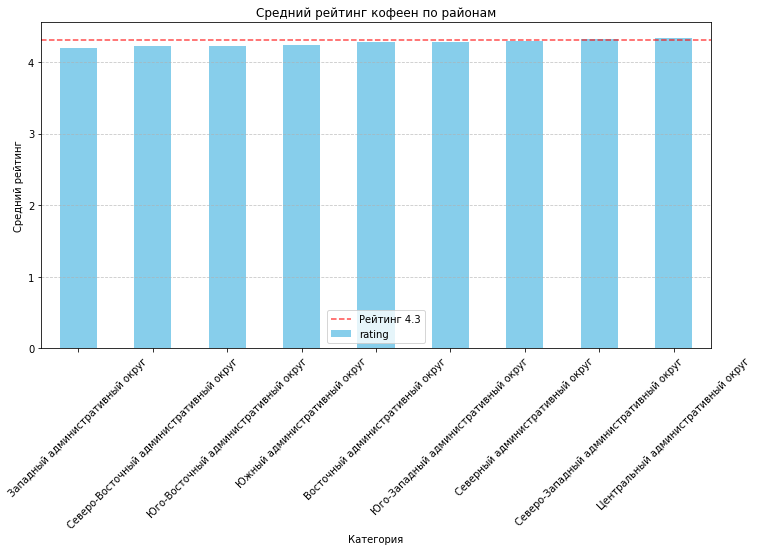

In [54]:
plt.figure(figsize=(12, 6))
average_rating_by_district.plot(kind='bar', color='skyblue')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.title('Средний рейтинг кофеен по районам')
plt.xticks(rotation=45)

plt.grid(axis='y', linestyle='--', alpha=0.7)

# Добавляем горизонтальную линию на уровне y=4.3
plt.axhline(y=4.3, color='red', linestyle='--', label='Рейтинг 4.3', alpha=0.7)

plt.legend()
plt.show()

- Средний рейтинг кофеен по районам практически одинаковый.
- наибольший рейтинг имеют кофейни в ЦАО и СЗАО.

In [55]:
data = data[data['middle_coffee_cup'] != 0]
coffee_df = data[data['category'] == 'кофейня']
middle_coffee = coffee_df.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round().sort_values('middle_coffee_cup', ascending=False)
display(middle_coffee)
print('Средняя стоимость чашки кофе в Москве:')

,district,middle_coffee_cup
1,Западный административный округ,190.0
5,Центральный административный округ,188.0
7,Юго-Западный административный округ,184.0
0,Восточный административный округ,174.0
2,Северный административный округ,166.0
4,Северо-Западный административный округ,166.0
3,Северо-Восточный административный округ,165.0
8,Южный административный округ,158.0
6,Юго-Восточный административный округ,151.0


Средняя стоимость чашки кофе в Москве:


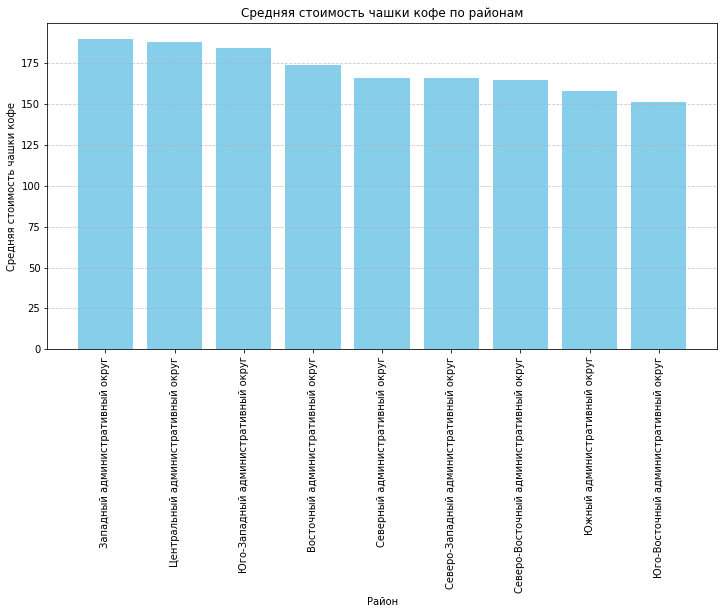

In [56]:
# Создание графика
plt.figure(figsize=(12, 6))
plt.bar(middle_coffee['district'], middle_coffee['middle_coffee_cup'], color='skyblue')
plt.xlabel('Район')
plt.ylabel('Средняя стоимость чашки кофе')
plt.title('Средняя стоимость чашки кофе по районам')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Добавление сетки
plt.show()

- по графику видно, что наибольшая средняя цена ожидаемо наблюдается в ЗАО и ЦАО.
- наименьшаая цена в ЮВАО;

**Вывод**
- Общее количество кофеен в датасете: 1413
- Район с наибольшим количеством кофеен: Центральный административный округ
- Количество кофеен в этом районе: 428
- Всего круглосуточных кофеен в регионе: 76
- Средний рейтинг кофеен по районам практически одинаковый.
- наибольший рейтинг имеют кофейни в ЦАО и СЗАО.
- по графику видно, что наибольшая средняя цена ожидаемо наблюдается в ЗАО и ЦАО.
- наименьшаая цена в ЮВАО;

При определении стоимости одной чашки кофе стоит ориентироваться на следующие факторы:

- Расходы на сырье и ингредиенты
- Арендная плата и операционные расходы
- Конкуренция и рыночная среда
- Целевая аудитория
- Маркетинг и брендинг
- Географическое расположение.

Наиболее приемлемой ценой за одну чашку кофе можно считать цену в диапазоне от 150 до 180 руб. Вместе с этим мы видим, что круглосуточных кофеен относительно мало, поэтому можно задуматься над тем, почему бы не открыть круглосуточное заведение. Территориально лучше всего начинать с кофеен, где не самое большое кол-во заведений, при этом если мы выбираем СЗАО, стоит подумать, почему там наименьшее кол-во кофеен (возможно, там высокая аренда или низкая рентабельность).

Презентация: <https://disk.yandex.ru/d/BnyFoazGIiEYSgЯ>